In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from DataTransformation import LowPassFilter
from scipy.signal import argrelextrema
from sklearn.metrics import mean_absolute_error

pd.options.mode.chained_assignment = None


# Plot settings
plt.style.use("fivethirtyeight")
plt.rcParams["figure.figsize"] = (20, 5)
plt.rcParams["figure.dpi"] = 100
plt.rcParams["lines.linewidth"] = 2

In [ ]:
df = pd.read_pickle("../../data/interim/data_resampled.pkl")

In [ ]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90


In [ ]:
df = df[df["label"] != "rest"]

In [ ]:
acc_r = df["acc_x"]**2 + df["acc_y"]**2 + df["acc_z"]**2
df["acc_r"] = np.sqrt(acc_r)
gyr_r = df["gyr_x"]**2 + df["gyr_y"]**2 + df["gyr_z"]**2
df["gyr_r"] = np.sqrt(gyr_r)

In [ ]:
bench_df = df[df["label"] == "bench"]
squat_df = df[df["label"] == "squat"]
row_df = df[df["label"] == "row"]
dead_df = df[df["label"] == "dead"]
ohp_df = df[df["label"] == "ohp"]

<AxesSubplot: xlabel='epoch (ms)'>

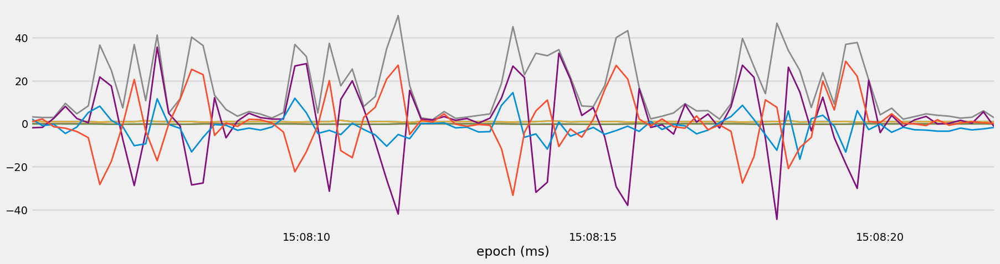

In [ ]:
plot_df = bench_df
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_r"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_x"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_y"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_z"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_r"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_x"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_y"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_z"].plot()

<AxesSubplot: xlabel='epoch (ms)'>

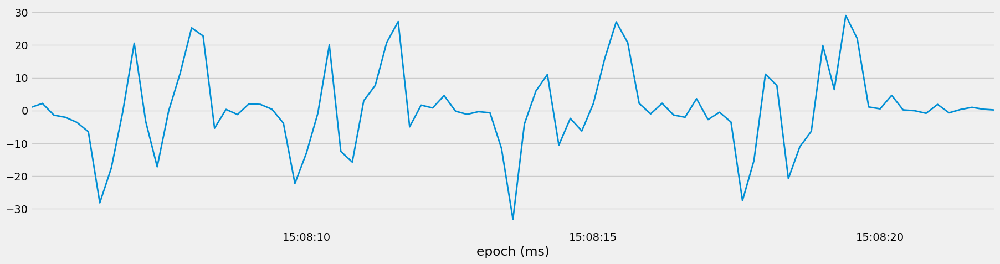

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_z"].plot()

<AxesSubplot: xlabel='epoch (ms)'>

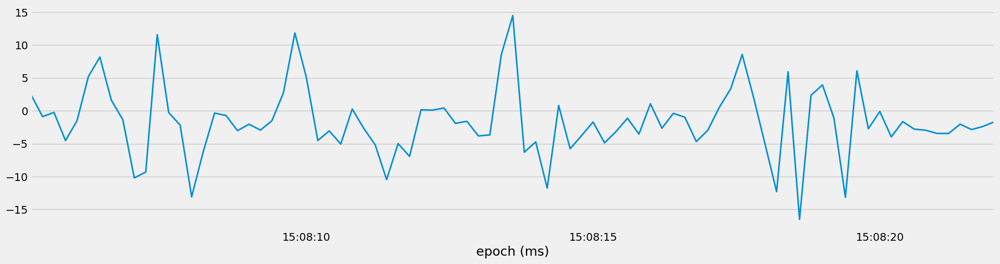

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_y"].plot()

In [ ]:
fs = 1000 / 200
lowpass = LowPassFilter()

# --------------------------------------------------------------
# Apply and tweak LowPassFilter
# --------------------------------------------------------------
bench_set = bench_df[bench_df["set"] == bench_df["set"].unique()[0]]
squat_set = squat_df[squat_df["set"] == squat_df["set"].unique()[0]]
row_set = row_df[row_df["set"] == row_df["set"].unique()[0]]
dead_set = dead_df[dead_df["set"] == dead_df["set"].unique()[0]]
ohp_set = ohp_df[ohp_df["set"] == ohp_df["set"].unique()[0]]

<AxesSubplot: xlabel='epoch (ms)'>

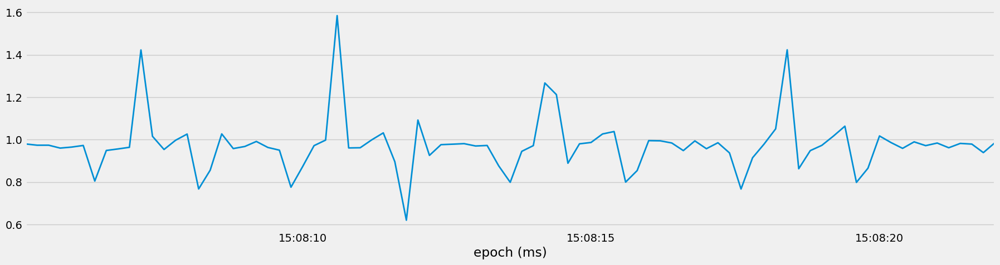

In [ ]:
bench_set['acc_r'].plot()

<AxesSubplot: xlabel='epoch (ms)'>

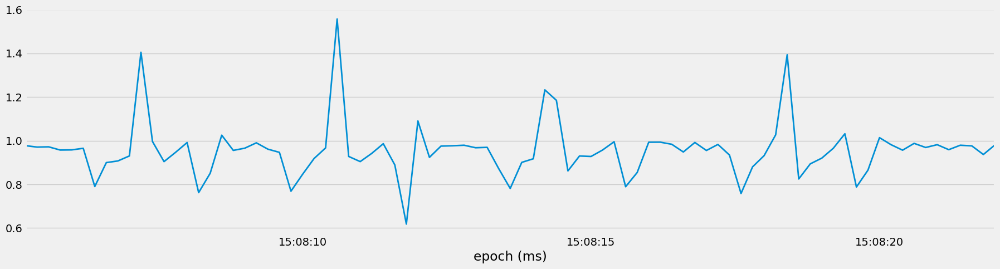

In [ ]:
bench_set['acc_y'].plot()

In [ ]:
column = "acc_y"

In [ ]:
column = "acc_y"

<AxesSubplot: xlabel='epoch (ms)'>

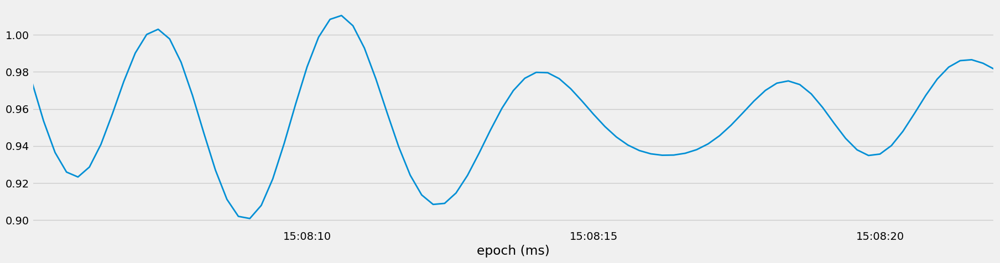

In [ ]:
lowpass.low_pass_filter(bench_set, column, fs, 0.4, order=10)[column+"_lowpass"].plot()

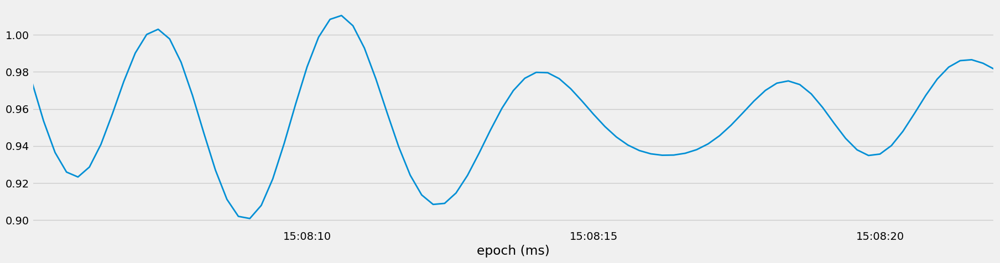

In [ ]:
data=lowpass.low_pass_filter(bench_set, column, fs, 0.4, order=10)[column+"_lowpass"].plot()

In [ ]:
data =lowpass.low_pass_filter(bench_set, column, fs, 0.4, order=10)

In [ ]:
argrelextrema(data[column + '_lowpass' ].values, np.greater)

(array([11, 27, 44, 66, 82], dtype=int64),)

In [ ]:
column = "acc_r"
data =lowpass.low_pass_filter(bench_set, column, fs, 0.4, order=10)

argrelextrema(data[column + '_lowpass' ].values, np.greater)

(array([11, 27, 46, 66, 82], dtype=int64),)

In [ ]:
def count_repetitions(data, column, fs, cutoff, order=10):
    data = lowpass.low_pass_filter(data, column, fs, cutoff, order)
    indexes = argrelextrema(data[column + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    return len(peaks)

In [ ]:
count_repetitions(bench_set)

TypeError: count_repetitions() missing 3 required positional arguments: 'column', 'fs', and 'cutoff'

In [ ]:
count_repetitions(bench_set,fs=fs)

TypeError: count_repetitions() missing 2 required positional arguments: 'column' and 'cutoff'

In [ ]:
count_repetitions(bench_set)

TypeError: count_repetitions() missing 3 required positional arguments: 'column', 'fs', and 'cutoff'

In [ ]:
def count_repetitions(data, cutoff=0.4, order=10, column="acc_r"):
    data = lowpass.low_pass_filter(data, column, fs, cutoff, order)
    indexes = argrelextrema(data[column + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    return len(peaks)

In [ ]:
count_repetitions(bench_set)

5

In [ ]:
def count_repetitions(data, cutoff=0.4, order=10, column="acc_r"):
    data = lowpass.low_pass_filter(data, column, fs, cutoff, order)
    indexes = argrelextrema(data[column + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    
    fig, ax = plt.subplots()
    plt.plot(data[column + "_lowpass"])
    plt.plot(peaks[column + "_lowpass"], "o",color='red')
    ax.set_ylabel(f"{column} lowpass")
    exercise = data["label"].iloc[0].title()
    category = data["category"].iloc[0].title()
    plt.title(f"{exercise} - {category} : {len(peaks)} repetitions")
    plt.show() 
    
    return len(peaks)

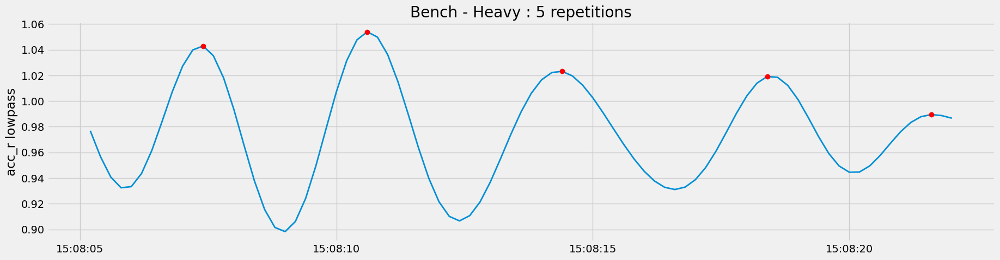

5

In [ ]:
count_repetitions(bench_set)

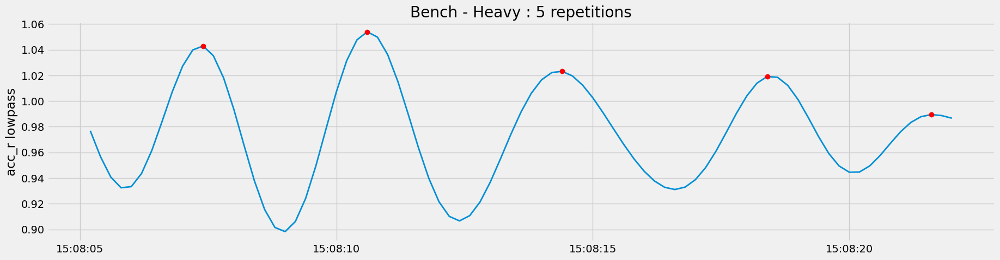

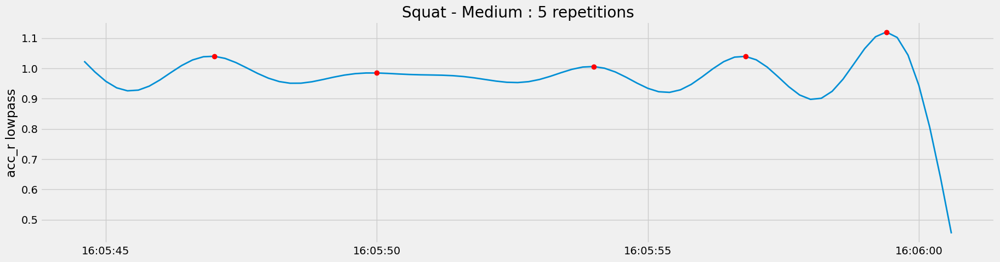

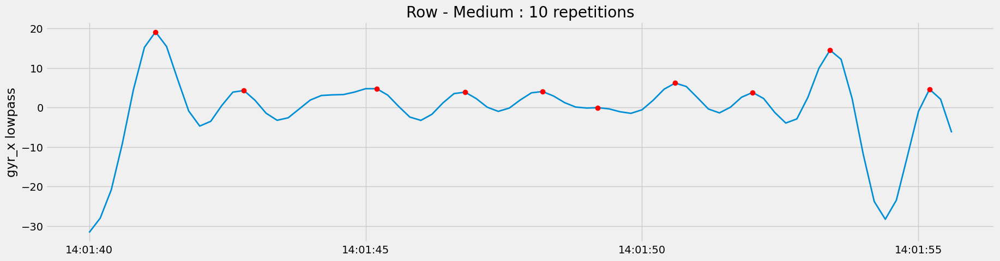

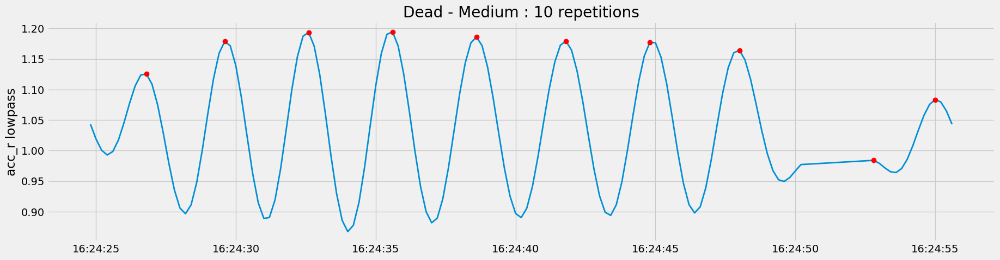

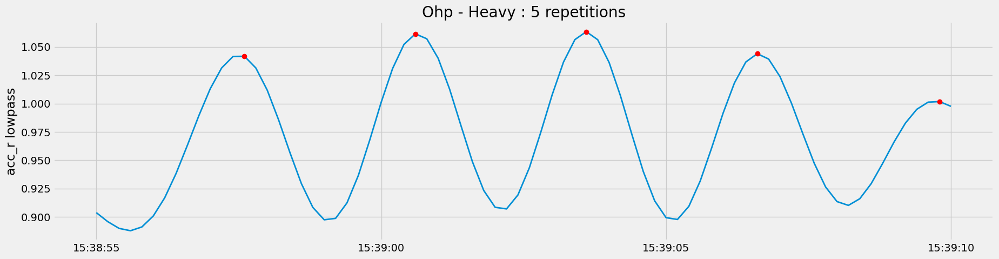

5

In [ ]:
count_repetitions(bench_set, cutoff=0.4)
count_repetitions(squat_set, cutoff=0.35)
count_repetitions(row_set, cutoff=0.65,column='gyr_x')
count_repetitions(dead_set, cutoff=0.4)
count_repetitions(ohp_set, cutoff=0.35)

In [ ]:
df['reps'] = df['category'].apply(lambda x: 5 if x == 'heavy'else 10)

In [ ]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r,reps
epoch (ms),,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30,0.979669,3.225625,5
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30,0.973752,2.887270,5
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30,0.973795,2.936720,5
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30,0.960118,9.473502,5
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30,0.964953,4.623585,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90,1.045408,5.804424,10
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90,1.032376,3.611408,10
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90,1.035995,5.869377,10


In [ ]:
rep_df = df.groupby(['label','set','category'])['reps'].max().reset_index()

In [ ]:
rep_df

,label,set,category,reps
0,bench,1,heavy,5
1,bench,2,heavy,5
2,bench,3,heavy,5
3,bench,4,heavy,5
4,bench,30,heavy,5
...,...,...,...,...
80,squat,62,heavy,5
81,squat,63,medium,10
82,squat,64,medium,10
83,squat,92,heavy,5


In [ ]:
rep_df = df.groupby(['label','category', 'set'])['reps'].max().reset_index()

In [ ]:
rep_df

,label,category,set,reps
0,bench,heavy,1,5
1,bench,heavy,2,5
2,bench,heavy,3,5
3,bench,heavy,4,5
4,bench,heavy,30,5
...,...,...,...,...
80,squat,medium,28,10
81,squat,medium,29,10
82,squat,medium,38,10
83,squat,medium,63,10


In [ ]:
rep_df['pres_pred'] = 0

In [ ]:
rep_df = df.groupby(['label','category', 'set'])['reps'].max().reset_index()

In [ ]:
rep_df['reps_pred'] = 0

In [ ]:
rep_df

,label,category,set,reps,reps_pred
0,bench,heavy,1,5,0
1,bench,heavy,2,5,0
2,bench,heavy,3,5,0
3,bench,heavy,4,5,0
4,bench,heavy,30,5,0
...,...,...,...,...,...
80,squat,medium,28,10,0
81,squat,medium,29,10,0
82,squat,medium,38,10,0
83,squat,medium,63,10,0


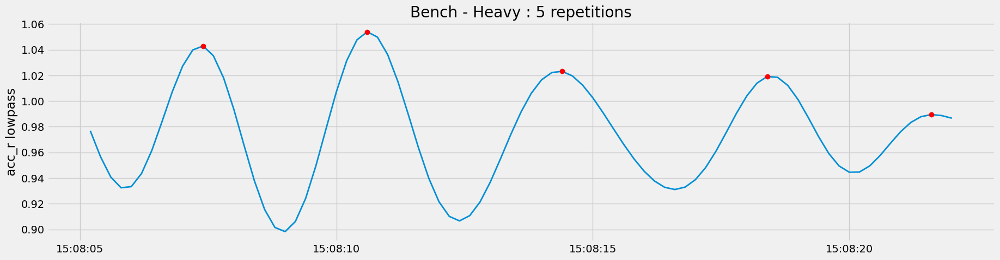

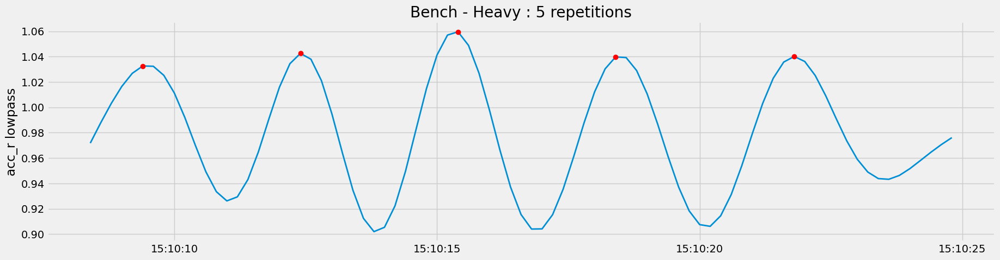

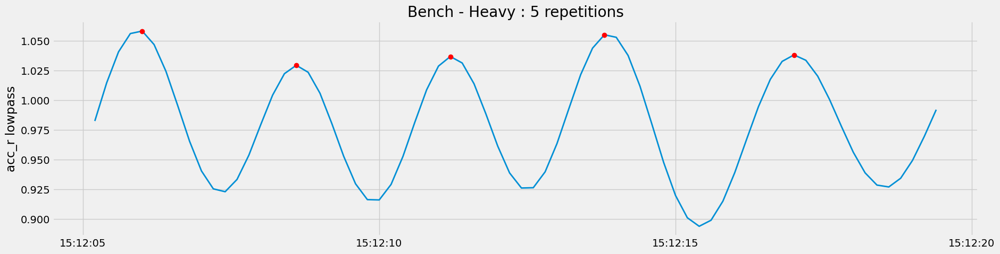

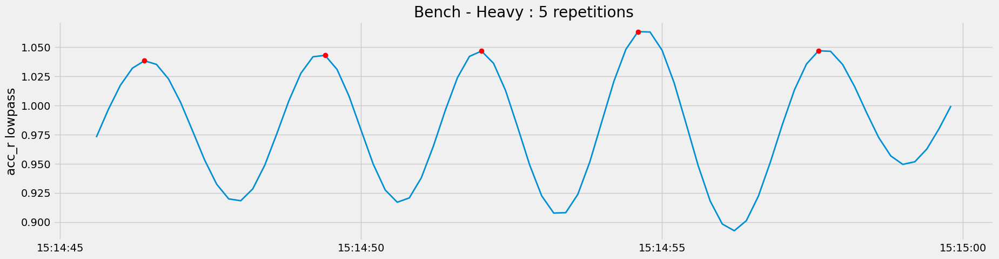

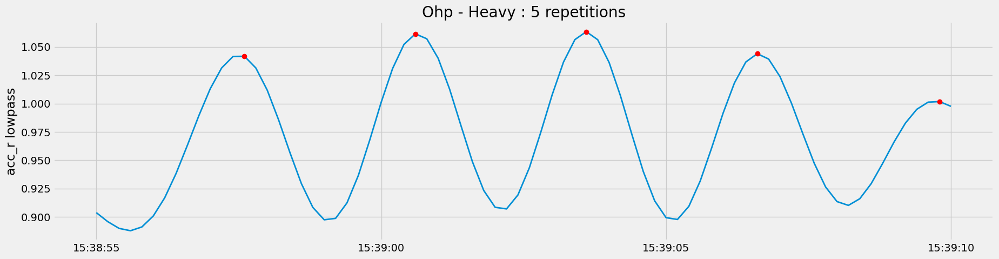

...

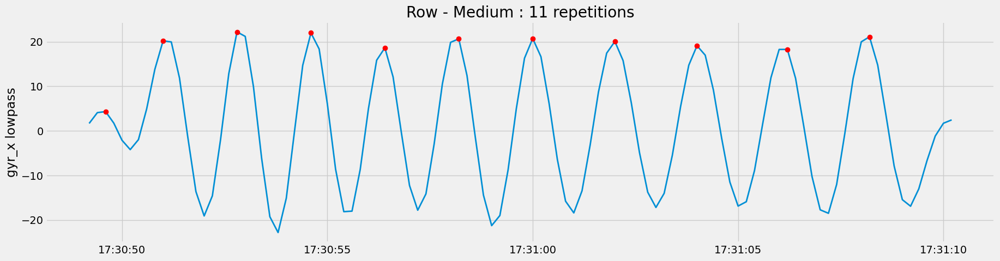

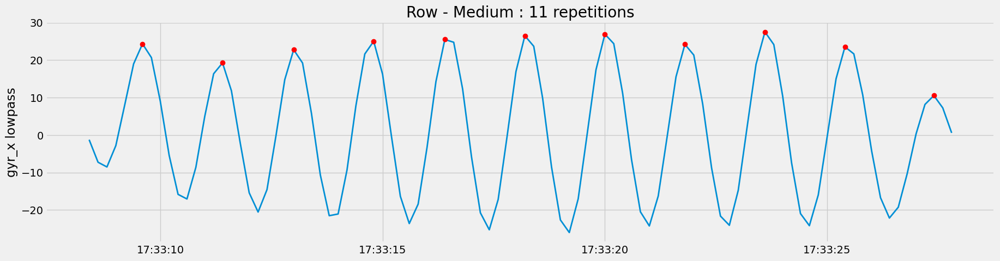

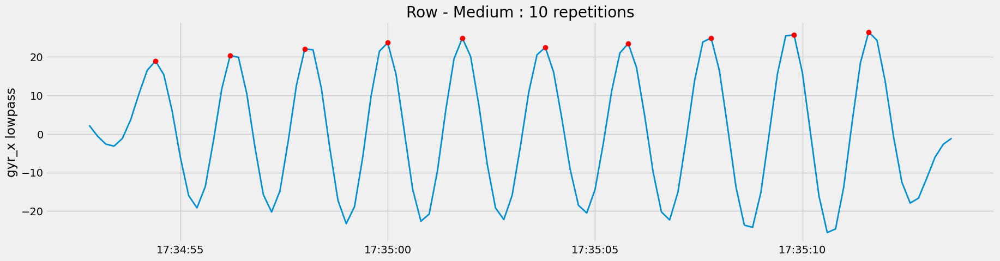

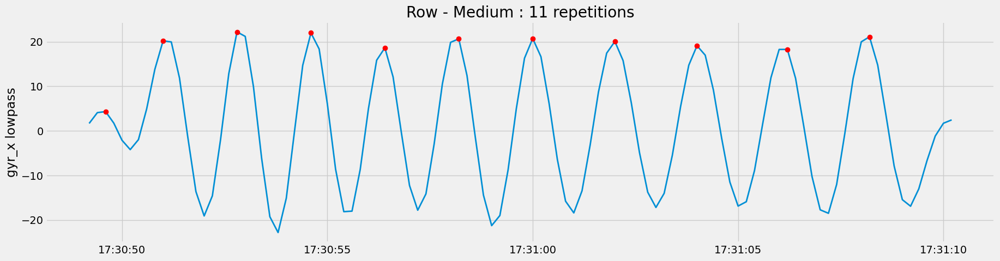

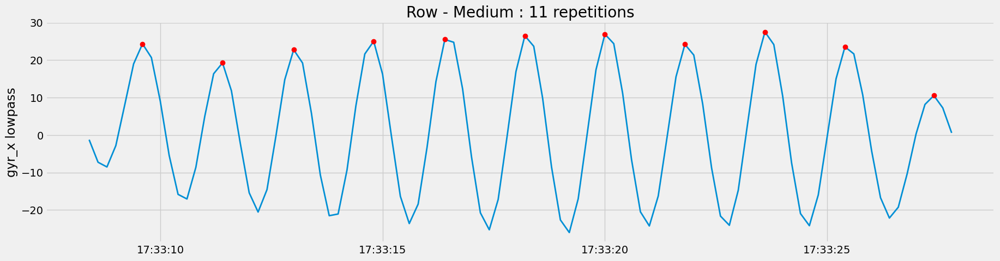

In [ ]:
for s in df['set'].unique():
    subset = df[df['set'] == s]
    column = 'acc_r'
    cutoff = 0.4
    
    if subset['label'].iloc[0] == 'squat':
        cutoff = 0.35
    elif subset['label'].iloc[0] == 'row':
        column = 'gyr_x'
        cutoff = 0.65
    elif subset['label'].iloc[0] == 'dead':
        cutoff = 0.4
    elif subset['label'].iloc[0] == 'ohp':
        cutoff = 0.35
    
    reps = count_repetitions(subset, cutoff=cutoff, column=column)
    
    rep_df.loc[(rep_df['set'] == s), 'reps_pred'] = reps

In [ ]:
rep_df

,label,category,set,reps,reps_pred
0,bench,heavy,1,5,5
1,bench,heavy,2,5,4
2,bench,heavy,3,5,5
3,bench,heavy,4,5,5
4,bench,heavy,30,5,5
...,...,...,...,...,...
80,squat,medium,28,10,8
81,squat,medium,29,10,8
82,squat,medium,38,10,7
83,squat,medium,63,10,11


In [ ]:
error = mean_absolute_error(rep_df['reps'], rep_df['reps_pred']).round(2)

In [ ]:
error

0.88

<AxesSubplot: xlabel='label,category'>

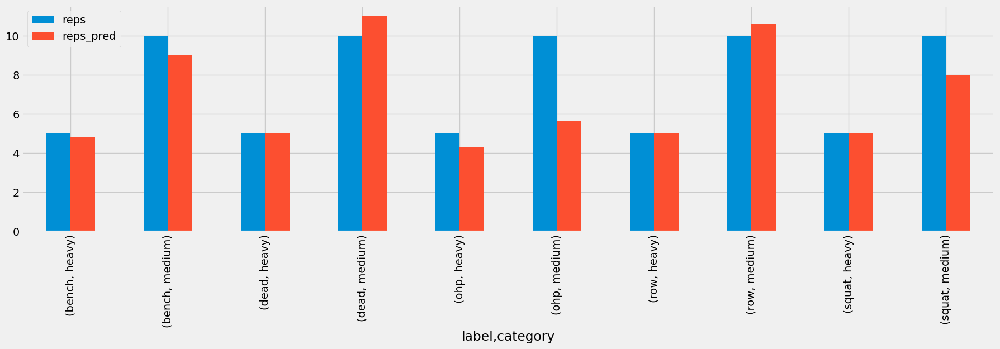

In [ ]:
rep_df.groupby(['label', 'category'])[['reps', 'reps_pred']].mean().plot.bar()